# <!-- TITLE --> Unsupervised classification of sound units segmented from soundscapes
---
<!-- DESC --> Machine learning framework to perform unsupervised classification of sound units segmented from soundscapes
<!-- AUTHOR --> : Sylvain Haupert and Juan Ulloa

### Objectives :
 - Providing a script to analyze soundscapes on a GoogleDrive
 - Testing a method to rapidly screen the acoustic content in soundscapes

The goal is to provide a workflow to process soundscapes coming from different recorders set in a tropical rain forest for 24h.

### What we're going to do :

*   Installing Bambird
*   Running Bambird on a dataset
*   Checking the clusters and compare them with a library of sounds produced by expected animals.

### Dataset :

The dataset is a collection of audio recordings from the project XPRIZE (Singapore). Each audio recording lasts 30 min, and they were recorded all day long during the entire May 2022

In this script, you will use the package bambird (more specificaly some functions from bamscape that contains the functions to analyse soundscapes).


## Step 1 - Setup the environment
---

Get the information about the virtual machine that Google gave you

In [1]:
# get info about the virtual machine
!lscpu |grep 'Model name'
!lscpu |grep 'Core(s) per socket:'
!free -h --si | awk  '/Mem:/{print $2}'

Model name:                         13th Gen Intel(R) Core(TM) i7-13700H


Core(s) per socket:                 14
63G


## 1.1 Global settings

Change or adapt the settings :
- to import the required packages
- to set the directories and the paths
- to set some global constatns
- to set the parameters for bambird

In [2]:
# Load basic packages
# --------------------
import shutil
import numpy as np
from pathlib import Path
import os
import datetime
import yaml
import sys
from glob import glob
from tqdm import tqdm

# scikit-learn (machine learning) package
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors

from scipy.signal.windows import tukey

# notebook display
from IPython.display import clear_output # to clear output of jupyter cell

# pandas
import pandas as pd

# import the custom packages
#----------------------------
import maad
import bambird

# Parallel processing packages
from concurrent import futures



Labels loaded.
load model True
Model loaded.
Labels loaded.
load_species_list_model
Meta model loaded.


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


**WARNING** Adapt the paths to your local configuration

In [3]:
# Define constants
# ----------------

# directory where to store the data 
# !!! NEED TO BE ADAPTED TO YOU OWN CONFIG !!!
PROJECT_PATH    = Path('/media/haupert/data/mes_projets/05_xprize/final')

# !!! NEED TO BE ADAPTED TO YOU OWN CONFIG !!!
# ARCHIVE_PATH    = Path('/media/haupert/data/mes_projets_data/xprize/french_guiana_july_ground')
ARCHIVE_PATH    = Path('/media/haupert/data/mes_projets_data/xprize/canopy_station')

# !!! NEED TO BE ADAPTED TO YOU OWN CONFIG !!!
PACKAGE_PATH = Path('/media/haupert/data/mes_projets/_packages/bamscape.git')

DATA_PATH = PROJECT_PATH / Path('DATASETS_BIRDNET')
SAVE_PATH = PROJECT_PATH / Path('RESULTS_BIRDNET')

# subdirectories where to store the dataset and the extracted rois
DATASET_NAME    = ARCHIVE_PATH.stem + '_all'
ROIS_NAME       = Path(str(DATASET_NAME) +'_ROIS')

# subsample the dataframe containing all the audio recordings
EVERY_N_ROWS = 10 # Set to 1 to keep all files.

# audio file extension
AUDIO_EXTENSION = 'WAV'

# Select the configuration file to segment, compute features and get the clusters
CONFIG_FILE     = 'config_soundscape.yaml'

EXTRACT_FEATURES = True


Then, change the settings of bambird. The default settings seems to work well but there are not optimized. Depending on the recorder, the settings of the recorder and the place, they might be adjusted

## 1.2 Bambird parameters



In [4]:
#@title settings of bambird { run: "auto", vertical-output: true, form-width: "300px", display-mode: "both" }

###### bambird parameters
# parameters to segment the regions of interest (ROIS)
SAMPLE_RATE= 44100      #@param [8000, 16000, 22000, 24000, 32000, 44100, 48000, 96000, 192000] # in Hz
LOW_FREQ = 50           # in Hz
HIGH_FREQ= 20000        # in Hz
OVLP= 0                 # define the percentage of overlap (0.5 => 50%)
AUDIO_DURATION= 60      # total duration of the file that will be processed in s
CHUNK_DURATION= 10      # the file is then cut in chunk of duration CHUNK_DURATION in s
MODE_RMBCKG = 'median'  #@param ["median", "mean"]                       # select the mode to remove background
N_RUNNING_MEAN= 25      # larger values will keep narrower continuous sound events
NFFT= 1024              #@param [128, 256, 512, 1024, 2048, 4096, 8192]

MAX_RATIO_YX    = 20                # Remove vertical narrow ROIs (mostly rain or noise)
MIN_EVENT_DUR   = 0.1               # Minimum time duration of an event (in s)
MAX_EVENT_DUR   = AUDIO_DURATION    # Maximum time duration of an event (in s)
MIN_FREQ_BW     = 50                # Minimum frequency bandwidth (in Hz). Could be a list of 2 elements (the min min and the max min)
MAX_FREQ_BW     = 8000              # Maximum frequency bandwidth (in Hz). Could be a list of 2 elements (the max min and the max max)
FUSION_ROIS     = (0.2, 100)        # (seconds, hertz) 
REMOVE_ROIS_FMIN_LIM = 50
REMOVE_ROIS_FMAX_LIM = None
REMOVE_RAIN     = True

SEED_LEVEL  = 16        # in dB (select the seeds to create the mask to segment the ROIs)
LOW_LEVEL   = 6         # in dB (select the lowest value that will be part of the mask to segment the ROIs)

# Save ROIs parameters
MARGIN_T= 0.100           #@param {type:"number"}  # time margin in s around the ROI
MARGIN_F= 250               #@param {type:"number"}  # frequency margin in Hz around the ROI
FILTER_ORDER= 5         #@param {type:"number"}  # butterworth filter order to select the bandwidth corresponding to the ROI

#  CNN margins
CNN_MARGINS_T= 3          # Minimum duration of the window in seconds around the ROI to extract the CNN features

# parameters to compute the features
METHOD_FEATURES = 'birdnet'     # birdnet maad
LATITUDE = -3.05           # Manaus latitude or None to ignore
LONGITUDE = -60.05          # Manaus longitude or None to ignore
# DATE = datetime.datetime(year=2023, month=7, day=24) # July or None to ignore   
# LATITUDE = None
# LONGITUDE = None
DATE = None

# parameters to cluster  the ROIs
# UMAP parameters
N_COMPONENTS= 10#20#10        # The dimension of the space to embed into. Should not be larger than 20 as (H)DBSCAN cannot handle vectors larger than 20 points.
N_NEIGHBORS= 30#30         # The size of local neighborhood (in terms of number of neighboring sample points) used for manifold approximation. 
                        # Larger values result in more global views of the manifold, while smaller values result in more local data being preserved
MIN_DIST= 0#0.1# 0             # The effective minimum distance between embedded points. Smaller values will result in a more clustered/clumped embedding 
                        # where nearby points on the manifold are drawn closer together, while larger values will result on a more even dispersal of points
N_AVG_UMAP= 1           # Number of UMAP that will be averaged. 
# (H)DBSCAN parameters
METHOD_CLUSTERING= 'HDBSCAN'       #@param ["DBSCAN", "HDBSCAN"]                   # clustering methods
MIN_PTS= 7             #@param {type:"number"}                         # min number of points to form a cluster
MIN_CORE_PTS= 7  
EPS= 'auto'             #@param {type:"raw"}                           # 'auto' or a value between 0 to 2 , usually between 0.05 and 0.15

INTERVAL_DURATION=1     # in s

# select the features that will be used to perform the clustering
birdnet = True                #@param {type:"boolean"}
shp = False              #@param {type:"boolean"}
centroid_f = False       #@param {type:"boolean"}
peak_f = False           #@param {type:"boolean"}
duration_t = False      #@param {type:"boolean"}
bandwidth_f = False     #@param {type:"boolean"}
min_f = False           #@param {type:"boolean"}
max_f = False           #@param {type:"boolean"}

FEATURES = []
if birdnet : FEATURES.append('x')
if shp : FEATURES.append('shp')
if centroid_f : FEATURES.append('centroid_f')
if peak_f : FEATURES.append('peak_f')
if duration_t : FEATURES.append('duration_t')
if bandwidth_f : FEATURES.append('bandwidth_f')
if min_f : FEATURES.append('min_f')
if max_f : FEATURES.append('max_f')

### other global parameters

In [5]:
# select the ROIs with SNR higher than SNR_HLIM
SNR_HLIM = 16           #@param {type:"slider", min:0, max:90, step:1}

# select the ROIs with centroid frequency between CENTROID_FREQ_LLIM and CENTROID_FREQ_HLIM (in Hz)
CENTROID_FREQ_HLIM = 20000 
CENTROID_FREQ_LLIM = 0


## 1.3 Define some local functions

In [6]:
# %%
def date_from_filename (filename) :
    # filename with format 'XXXX_yyyymmdd_hhmmss.wav'
    # extract year, month, day, hour, minute and second from the filename
    # notice the underscore _ which splits the filename into several parts
    year = int(filename.split('_')[1][0:4])
    month = int(filename.split('_')[1][4:6])
    day = int(filename.split('_')[1][6:8])
    hour = int(filename.split('_')[2][0:2])
    minute = int(filename.split('_')[2][2:4])
    #second = int(filename.split('_')[2][4:6])
    second = 00

    # create a datetime object from the extracted parameters
    date = datetime.datetime(year, month, day, hour, minute, second)

    return date

def diffcumspec(spec1, spec2):
    
    s1 = spec1[:, 1] if spec1.ndim == 2 and spec1.shape[1] == 2 else spec1
    s2 = spec2[:, 1] if spec2.ndim == 2 and spec2.shape[1] == 2 else spec2
    
    n1 = len(s1)
    n2 = len(s2)
    
    if n1 != n2:
        raise ValueError("spec1 and spec2 must have the same length")
    
    if np.isnan(s1).any() or np.isnan(s2).any():
        D = np.nan
        print("The data set contains 'NA' values. The returned values have been set to NA.")
        return D
    else:
        if np.any(s1 < 0) or np.any(s2 < 0):
            raise ValueError("spectra (spec1 and/or spec2) do not have to be in dB")
        
        if np.sum(s1) == 0:
            print("Caution!, spec1 is a null spectrum")
        
        if np.sum(s2) == 0:
            print("Caution!, spec2 is a null spectrum")
        
        s1 = s1 / np.sum(s1)
        s2 = s2 / np.sum(s2)
        
        cum_s1 = np.cumsum(s1)
        cum_s2 = np.cumsum(s2)
        
        D = np.sum(np.abs(cum_s1 - cum_s2)) / n1

    return D

# %%
def find_representative_samples (df_cluster):
            
    # copy
    df = df_cluster.copy()

    # set cluster_number as the index
    # df.set_index("cluster_number", inplace = True)

    # convert the features to numpy array
    df['features'] = df['features'].apply(lambda x: np.array(x))
    
    # dataframe with the average features of each cluster
    df_avg = pd.DataFrame({'features' : df.groupby('cluster_number')['features'].apply(np.mean)})
    
    # dataframe with the nearest samples to the center of each cluster
    df['dist_likeness'] = np.nan
    df['normdist'] = np.nan
    df['dist'] = np.nan
    df['cosine_likeness'] = np.nan
    df['cosine'] = np.nan
    df['model'] = 0
    
    for index, y in df_avg.iterrows():  

        # if noise, continue
        if index == -1 :
            continue
        
        # variables
        y = y.features  # average features
        X = np.array(df[df.cluster_number == index].features.tolist()) # all the features of the cluster

        # distance
        neighbors = NearestNeighbors(n_neighbors=len(X))
        neighbors_fit = neighbors.fit(X)
        distances, index_sample = neighbors_fit.kneighbors([y])       
        d = distances[0]

        # angle
        a = cosine_similarity(X, y.reshape(1,-1)).flatten()
        
        # Give an indicator of the likeness of the sample regarding its cluster
        #-------------------------------------------------------------------------
        # 1 is the closest sample to the model (the most likeness of the cluster)
        # 0.5 is as half the distance between the furthest and the closest
        # 0 is the furthest sample (should be very different to the avg sample)
        df.update(pd.DataFrame({'dist_likeness': 1-(d-min(d))/(max(d)-min(d))},
                                index =  df[df.cluster_number == index].iloc[index_sample[0]].index ))
        # normalized distance
        # 1 is the closest to the model 
        # 2 is twice the distance to the model
        # 10 is ten times the minimum distance to the model
        df.update(pd.DataFrame({'normdist': d/d[0]},
                                index =  df[df.cluster_number == index].iloc[index_sample[0]].index ))
        # absolute distance
        d = distances[0]
        df.update(pd.DataFrame({'dist': d},
                                index =  df[df.cluster_number == index].iloc[index_sample[0]].index ))
        # similarity (cosine)
        # 1 both vectors are colinear (the angle is 0°)
        # 0 both vectors are orthogonal (the angle is 90°)
        df.update(pd.DataFrame({'cosine': a},
                                index =  df[df.cluster_number == index].iloc[index_sample[0]].index ))
        # 1 is the closest sample to the model (the most likeness of the cluster)
        # 0.5 is as half the angle between the furthest and the closest
        # 0 is the furthest sample (should be very different to the avg sample)
        df.update(pd.DataFrame({'cosine_likeness': (a-min(a))/(max(a)-min(a))},
                                index =  df[df.cluster_number == index].iloc[index_sample[0]].index ))

        # df_cluster_per_file['features'] = df_cluster_per_file['features'].apply(lambda x: np.array(x))
        # # Compute the silhouette scores for each sample
        # X = np.array(df_cluster_per_file.features.tolist())
        # silhouette = silhouette_samples(X, df_cluster_per_file['cluster_number'])
        # df_cluster_per_file['silhouette'] = silhouette

        # add a column "model"
        # 1 => the closest to the average features = model, 0 either.        
        idx = df[df.cluster_number == index].iloc[index_sample[0][0]].name
        df.at[idx,'model'] = 1

    return df

# %%
def select_cluster_percentile (
                            df_cluster,
                            column      = "cluster_number",
                            percentile  = 75,
                            remove_noise= True
                            ) :
    # Count the number of ROIs per cluster and select the first "percentile" of
    # cluster, from the biggest (percentile = 1) to the smallest (percentile = 99)
    # Does not take into account the cluster "noise" (=-1)

    # copy the dataframe
    df = df_cluster.copy()

    # clean df_cluster by removing the noise : -1
    if remove_noise :
        df = df[df[column] >-1]

    # count the number of each value
    counts = df[column].value_counts()

    # sort counts value from the highest count to the lowest
    counts = counts.sort_values(ascending=False)

    # select the vector of id
    cumulative = counts.cumsum() / counts.sum()
    mask = cumulative > (percentile / 100)
    idx = cumulative[mask].index[0]
    selected = counts.loc[:idx]

    # filter the dataframe to keep only the biggest clusters
    df = df[df[column].isin(selected.index)]

    return df

def copy_matching_files(source_dir, 
                        destination_dir, 
                        pattern="*"):
    """
    Copies files matching a pattern from source directory to destination directory.

    Args:
        source_dir: Path to the source directory.
        destination_dir: Path to the destination directory.
        pattern: Glob pattern to match files (default: "*").
    """
    from glob import glob
    
    source_dir = Path(source_dir)
    destination_dir = Path(destination_dir)

    # Get all matching files as Path objects
    matching_files = glob(str(source_dir / pattern), recursive=True)
    matching_files = [Path(file) for file in matching_files]

    # Create destination directory if it doesn't exist
    if not destination_dir.exists():
        destination_dir.mkdir()

    # Copy each matching file
    for file in matching_files:
        relative_path = file.relative_to(source_dir)
        dest_file = destination_dir / relative_path
        dest_file.parent.mkdir(parents=True, exist_ok=True)
        shutil.copy2(file, dest_file)

def extract_roi (filename, min_t, max_t, min_f, max_f, margins=None, normalize=False, save_path=None):
    """
    create a function that open an audio file and extract a roi
    
    Parameters
    ----------
    filename : str
        path to the audio file
    min_t : float
        start time of the roi in seconds
    max_t : float
        end time of the roi in seconds
    min_f : float
        start frequency of the roi in Hz
    max_f : float
        end frequency of the roi in Hz
    margins : list  (default None)
        margins to add to the roi (time, frequency) in seconds and Hz
    save_path : str (default None)
        path to save the roi
    """
    
    # open the audio file
    s, fs = maad.sound.load(filename)

    # duration
    duration = len(s) / fs

    if margins is not None :
        min_t = max(0.0, min_t - margins[0])
        max_t = min(duration, max_t + margins[0])
        min_f = max(1, min_f - margins[1])
        max_f = min(fs/2, max_f + margins[1])

    # extract the roi
    roi = maad.sound.trim(s, fs, min_t, max_t)
    roi = maad.sound.select_bandwidth(roi, fs, fcut=[min_f, max_f], forder=1, ftype='bandpass')
    # fade in and fade out roi
    # create a tukey window of 1% of the roi duration
    win = tukey(roi.size, alpha=0.01)
    roi = roi * win

    # normalization
    if normalize:
        roi = maad.sound.normalize(roi)
    
    # save the roi
    if save_path is not None:
        # test if the parent directory exists
        if not os.path.exists(os.path.dirname(save_path)):
            os.makedirs(os.path.dirname(save_path))
        # save the roi
        maad.sound.write(filename=save_path, fs=fs, data=roi, bit_depth=16)
    
    return roi


## Step 2 - Data processing
---

Load the configuration file. In case of soundscapes, the file ***config_soundscape.yaml*** works well for most soundscapes. Of course you can also edit the file and adapt the parameters to your need.

## 2.1 Configuration

In [7]:
# Load the configuration file
# -----------------------------
params = bambird.load_config(PACKAGE_PATH / "src/bambird" / CONFIG_FILE)

# change some parameters
params['PARAMS_EXTRACT']['SAMPLE_RATE'] = SAMPLE_RATE
params['PARAMS_EXTRACT']['HIGH_FREQ'] = HIGH_FREQ
params['PARAMS_EXTRACT']['LOW_FREQ'] = LOW_FREQ
params['PARAMS_EXTRACT']['OVLP'] = OVLP
params['PARAMS_EXTRACT']['AUDIO_DURATION'] = AUDIO_DURATION
params['PARAMS_EXTRACT']['CHUNK_DURATION'] = CHUNK_DURATION

params['PARAMS_EXTRACT']['MODE_RMBCKG'] = MODE_RMBCKG
params['PARAMS_EXTRACT']['N_RUNNING_MEAN'] = N_RUNNING_MEAN
params['PARAMS_EXTRACT']['NFFT'] = NFFT

params['PARAMS_EXTRACT']['MAX_RATIO_YX'] = MAX_RATIO_YX
params['PARAMS_EXTRACT']['MIN_EVENT_DUR'] = MIN_EVENT_DUR
params['PARAMS_EXTRACT']['MAX_EVENT_DUR'] = MAX_EVENT_DUR
params['PARAMS_EXTRACT']['MIN_FREQ_BW'] = MIN_FREQ_BW
params['PARAMS_EXTRACT']['MAX_FREQ_BW'] = MAX_FREQ_BW
params['PARAMS_EXTRACT']['REMOVE_ROIS_FMIN_LIM'] = REMOVE_ROIS_FMIN_LIM
params['PARAMS_EXTRACT']['REMOVE_ROIS_FMAX_LIM'] = REMOVE_ROIS_FMAX_LIM
params['PARAMS_EXTRACT']['FUSION_ROIS'] = FUSION_ROIS
params['PARAMS_EXTRACT']['REMOVE_RAIN'] = REMOVE_RAIN

params['PARAMS_EXTRACT']['SEED_LEVEL'] = SEED_LEVEL
params['PARAMS_EXTRACT']['LOW_LEVEL'] = LOW_LEVEL

params['PARAMS_EXTRACT']['MARGIN_T'] = MARGIN_T
params['PARAMS_EXTRACT']['MARGIN_F'] = MARGIN_F
params['PARAMS_EXTRACT']['CNN_MARGINS_T'] = CNN_MARGINS_T

params['PARAMS_FEATURES']['METHOD'] = METHOD_FEATURES
params['PARAMS_FEATURES']['SAMPLE_RATE'] = SAMPLE_RATE
params['PARAMS_FEATURES']['HIGH_FREQ'] = HIGH_FREQ
params['PARAMS_FEATURES']['LOW_FREQ'] = LOW_FREQ
params['PARAMS_FEATURES']['LATITUDE'] = LATITUDE
params['PARAMS_FEATURES']['LONGITUDE'] = LONGITUDE
params['PARAMS_FEATURES']['DATE'] = DATE

params['PARAMS_CLUSTER']['N_COMPONENTS'] = N_COMPONENTS
params['PARAMS_CLUSTER']['N_NEIGHBORS'] = N_NEIGHBORS
params['PARAMS_CLUSTER']['MIN_DIST'] = MIN_DIST
params['PARAMS_CLUSTER']['N_AVG_UMAP'] = N_AVG_UMAP

params['PARAMS_CLUSTER']['METHOD'] = METHOD_CLUSTERING
params['PARAMS_CLUSTER']['MIN_PTS'] = MIN_PTS
params['PARAMS_CLUSTER']['MIN_CORE_PTS'] = MIN_CORE_PTS
params['PARAMS_CLUSTER']['FEATURES'] = FEATURES
params['PARAMS_CLUSTER']['EPS'] = EPS

params['PARAMS_CLUSTER']['INTERVAL_DURATION'] = INTERVAL_DURATION

use the function <bambird.extract_rois_in_soundscape> to segment ROIS


## 2.2 Grab and prepare audio

In [8]:
# Grab audio
# -------------------
df = maad.util.date_parser(ARCHIVE_PATH, dateformat='%Y%m%d_%H%M%S', extension='.'+AUDIO_EXTENSION, prefix = '', verbose=False)

# rename the column file into fullfilename
df.reset_index(inplace=True)

# rename the column file into fullfilename
df.rename(columns={'file':'fullfilename'}, inplace=True)
df.rename(columns={'Date':'date'}, inplace=True)

# add a column with the filename without the full path
df['filename'] = df['fullfilename'].apply(lambda x: Path(x).name)

# print the number of audio recordings
print("The number of audio recordings is %d" %len(df))

The number of audio recordings is 235


**Subsamples the dataframe** in order to make quick tests

In [9]:
# Keep rows every N rows
df = df.iloc[::EVERY_N_ROWS, :]

# print the number of audio recordings
print("The number of audio recordings that will be processed is %d" %len(df))

The number of audio recordings that will be processed is 24


## 2.3 Extract ROIS



*   First extract ROIS of a single file in order to see if the parameters are fine.
*   Display the SNR for each ROIS found in the audio file





CATEGORIES : canopy_station
NUMBER OF CHUNKS : 6

time resolution 0.011609977324263039s
frequency resolution 43.06640625s
BGN 26.65728288889521dB / SNR 3.9418698062570954dB
BEFORE MERGING FOUND 73 ROIS 
=> AFTER MERGING FOUND 35 ROIS
=> number of ROIS after ploting 35
=> number of ROIS after ploting 35

time resolution 0.011609977324263039s
frequency resolution 43.06640625s
BGN 26.65756343469607dB / SNR 4.306752700688207dB
BEFORE MERGING FOUND 66 ROIS 
=> AFTER MERGING FOUND 43 ROIS
=> number of ROIS after ploting 43
=> number of ROIS after ploting 43

time resolution 0.011609977324263039s
frequency resolution 43.06640625s
BGN 26.657593461650322dB / SNR 4.374204659700087dB
BEFORE MERGING FOUND 55 ROIS 
=> AFTER MERGING FOUND 37 ROIS
=> number of ROIS after ploting 37
=> number of ROIS after ploting 37

time resolution 0.011609977324263039s
frequency resolution 43.06640625s
BGN 26.657263954767703dB / SNR 3.8701750828898547dB
BEFORE MERGING FOUND 38 ROIS 
=> AFTER MERGING FOUND 28 ROIS


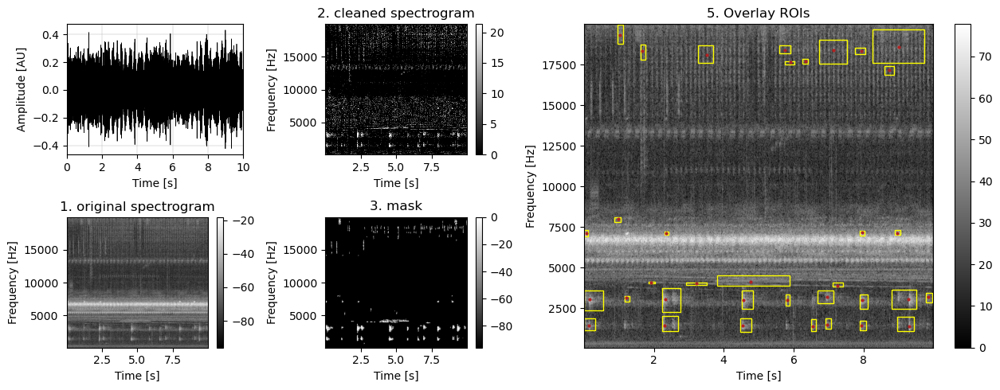

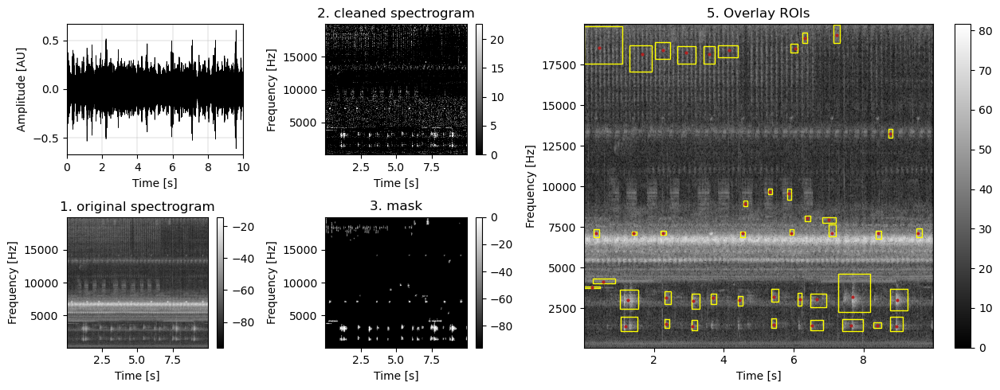

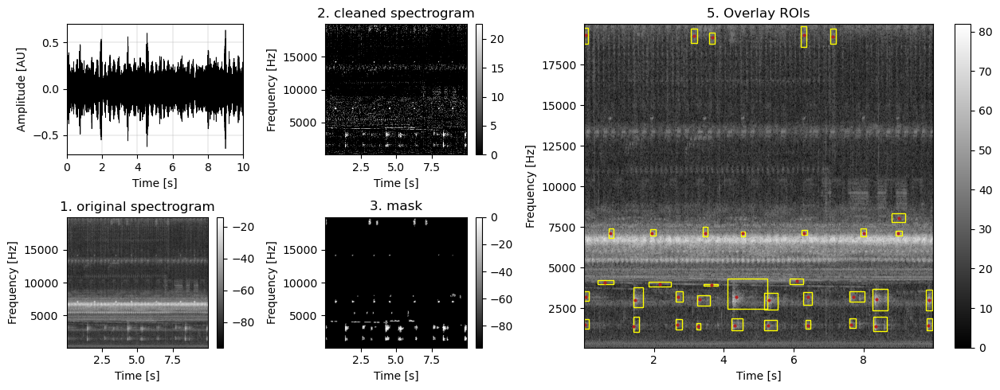

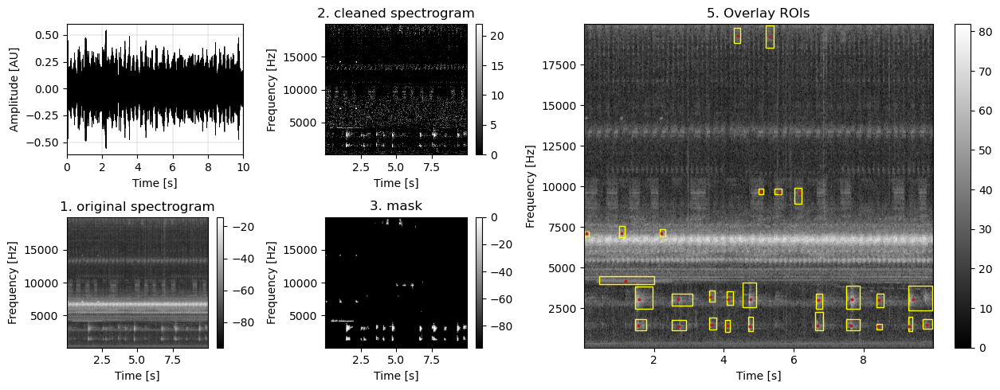

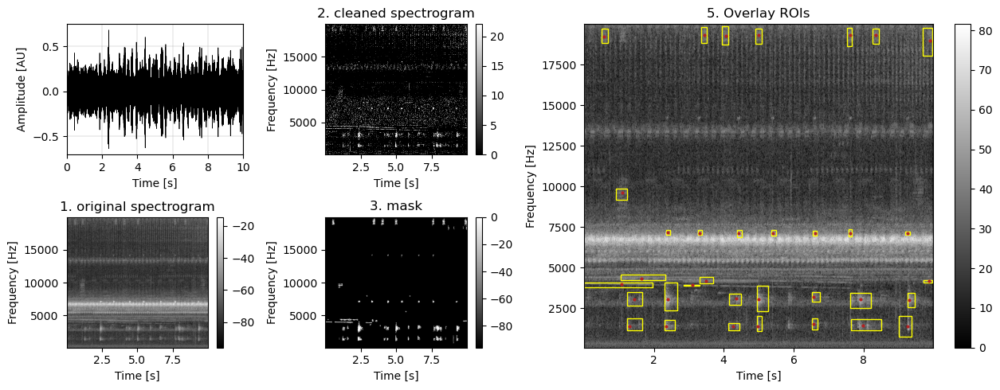

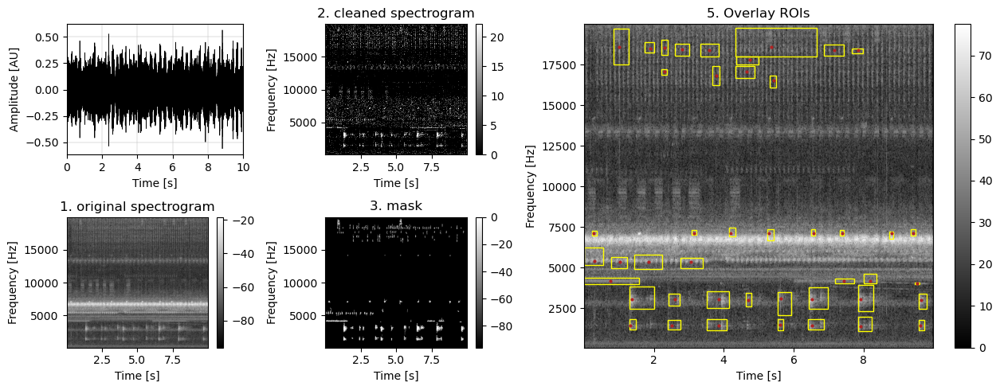

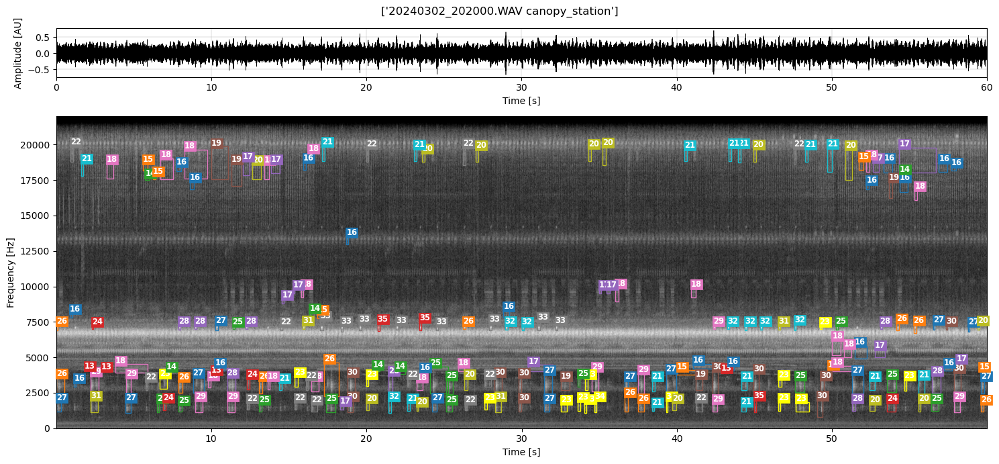

In [10]:
# Extract ROIS of a single file
# -------------------------------

# ROIS extraction of a single file
df_rois_single = bambird.single_file_extract_rois (
                    audio_path  = df.sample().fullfilename.squeeze(),
                    # audio_path  = ARCHIVE_PATH / '20240302_162500.WAV',  # if a specific file needs to be tested 
                    fun         = params['PARAMS_EXTRACT']['FUNC'],
                    params      = params['PARAMS_EXTRACT'],
                    save_path   = DATA_PATH / ROIS_NAME,
                    display     = True,
                    verbose     = True)

# and display the ROIs on the file
# convert the column snr into integer in order to use the value as a label for each ROI
# This is temporary, only on df_rois_single that will not be used after
if len(df_rois_single) > 0 : # test if there is at least a single ROI
  df_rois_single["snr"] = df_rois_single["snr"].apply(int)
  bambird.overlay_rois(
                      cluster         = df_rois_single,
                      params          = params['PARAMS_EXTRACT'],
                      column_labels   = 'snr', 
                      unique_labels   = np.sort(df_rois_single.snr.unique()),
                      filename        = None,
                      random_seed     = None,
                      verbose         = True
                      )
else :
  print("No ROI was found")

Extract all the ROIS. It takes about 1 min for 200 1 min audio files

In [11]:
# Extract ROIS
# -------------------------------

# ROIS extraction of the full dataset
df_rois, csv_rois = bambird.multicpu_extract_rois(
                    dataset     = df,
                    params      = params['PARAMS_EXTRACT'],
                    save_path   = DATA_PATH / ROIS_NAME,
                    overwrite   = True,
                    verbose     = True
                    )

print("{} rois were found".format(len(df_rois)))

======================= EXTRACT ROIS =========================

The directory /media/haupert/data/mes_projets/05_xprize/final/DATASETS_BIRDNET/canopy_station_all_ROIS already exists and will be overwritten
Composition of the dataset : 
   -number of files : 24
   -number of categories :  1
   -unique categories : ['default']
<function extract_rois_in_soundscape at 0x7c3a12594700>


100%|██████████| 24/24 [00:18<00:00,  1.29it/s]




3509 new ROIs added in /media/haupert/data/mes_projets/05_xprize/final/DATASETS_BIRDNET/canopy_station_all_ROIS
3509 rois were found


In [12]:
# find the audio file (filename) in df that are not in the dataframe df_rois
# this is useful to check if some files were not processed
df_missing = df[~df['filename'].isin(df_rois['filename'])]['filename']

print("The number of audio recordings that were not processed is %d / %d" %(len(df_missing), len(df)))
print("List of these audio files :")
display(df_missing)

The number of audio recordings that were not processed is 0 / 24
List of these audio files :


Series([], Name: filename, dtype: object)

## 2.4 Compute features
It takes about an hour for about 80 000 ROIs

Hide cell ouput (https://pieriantraining.com/jupyter-notebook-output-suppression-a-tutorial/)
1. Select the cell whose output you want to hide.
2. Click on the Cell menu at the top of the screen.
3. Click on Cell Tags.
4. Enter “hide_output” (without quotes) in the input field.
5. Press Enter.

In [13]:
# # Compute features for each ROIS
# # -------------------------------
import time
import ipywidgets as widgets

out = widgets.Output(layout={'border': '1px solid black'})

# test if the csv file DATA_PATH / ROIS_NAME / 'birdnet_features.csv' already exists
if not (DATA_PATH / ROIS_NAME / 'birdnet_features.csv').exists():

    print("Compute the features for each ROI...")

    # compute the features on the full dataset
    # loop over the dataframe df_rois by blocks of 500 rows
    for i in range(0, len(df_rois), 500):
        time.sleep(2)
        clear_output(wait=True)
        try:
            # select the block of 500 rows
            sub_df_rois = df_rois.iloc[i:i+500]
        except:
            # if the last block is smaller than 500
            sub_df_rois = df_rois.iloc[i:]
        # compute the features
        _, _ = bambird.multicpu_compute_features(
                        dataset            = sub_df_rois,
                        params              = params['PARAMS_FEATURES'],
                        save_path           = DATA_PATH / ROIS_NAME,
                        save_csv_filename   ='birdnet_features_'+str(i)+'.csv',
                        overwrite           = True,
                        verbose             = True)

    # merge all the csv files into a single one
    # list all the csv files
    csv_files = glob(str(DATA_PATH / ROIS_NAME / 'birdnet_features_*.csv'))
    # read all the csv files
    df_features = pd.concat([pd.read_csv(file, sep=';') for file in csv_files], ignore_index=True)   
    # save the dataframe into a single csv file
    df_features.to_csv(DATA_PATH / ROIS_NAME / 'birdnet_features.csv', sep=';', index=False)
    # delete the csv files
    for file in csv_files:
        os.remove(file)

else:
    print("The features have already been computed")
    # load the csv file
    df_features = pd.read_csv(DATA_PATH / ROIS_NAME / 'birdnet_features.csv', sep=';')

    print("The number of ROIs is %d" %len(df_features))
    



====================== COMPUTE FEATURES ======================

Composition of the dataset : 
   -number of files :  9
   -number of categories :  1
   -unique categories : ['canopy_station']


  0%|          | 0/9 [00:00<?, ?it/s]

read_audio_data
read_audio_data
read_audio_data
read_audio_data
read_audio_data
read_audio_data
read_audio_data
read_audio_data: complete, read  1 chunks.
analyze_recording 20240302_234000_50s_68.wav
recording has lon/lat
set_predicted_species_list_from_position
return_predicted_species_list
-1
928 species loaded.
read_audio_data
read_audio_data
read_audio_data: complete, read  1 chunks.
analyze_recording 20240302_211000_50s_60.wav
recording has lon/lat
set_predicted_species_list_from_position
return_predicted_species_list
-1
read_audio_data: complete, read  1 chunks.
analyze_recording 20240302_234000_50s_69.wav
recording has lon/lat
set_predicted_species_list_from_position
return_predicted_species_list
-1
928 species loaded.
928 species loaded.
read_audio_data: complete, read  1 chunks.
analyze_recording 20240302_211000_50s_70.wav
recording has lon/lat
set_predicted_species_list_from_position
return_predicted_species_list
-1
read_audio_data: complete, read  1928 chunks. read_audio_dat

 11%|█         | 1/9 [00:00<00:05,  1.59it/s]


species loaded.
read_audio_data
read_audio_data: complete, read read_audio_data: complete, read   1 chunks.1 chunks.

analyze_recordingread_audio_data: complete, read  extract_embeddings_for_recording 120240302_211000_50s_70.wav 
chunks.
 extract_embeddings_for_recording20240302_211000_50s_69.wav
recording has lon/lat 
set_predicted_species_list_from_positionread_audio_data: complete, read  
1return_predicted_species_list20240302_211000_50s_77.wav 
chunks.
-1

extract_embeddings_for_recording 20240302_211000_50s_60.wav
928 species loaded.
read_audio_data: complete, read  1 chunks.
analyze_recording 20240302_211000_50s_78.wav
recording has lon/lat
set_predicted_species_list_from_position
return_predicted_species_list
-1
928 species loaded.read_audio_data



 33%|███▎      | 3/9 [00:00<00:01,  4.61it/s]

read_audio_data: complete, read read_audio_data 
1 chunks.
extract_embeddings_for_recording 20240302_211000_50s_63.wav
read_audio_data: complete, read  1 chunks.
extract_embeddings_for_recording 20240302_211000_50s_69.wav
read_audio_data: complete, read  1 chunks.
analyze_recording 20240302_234000_50s_70.wav
recording has lon/lat
set_predicted_species_list_from_position
return_predicted_species_list
-1
read_audio_data
928 species loaded.
read_audio_data: complete, read  1 chunks.
extract_embeddings_for_recording 20240302_211000_50s_78.wav


 44%|████▍     | 4/9 [00:00<00:00,  5.03it/s]

read_audio_data
read_audio_data: complete, read  1 chunks.
extract_embeddings_for_recording 20240302_234000_50s_70.wav


100%|██████████| 9/9 [00:01<00:00,  8.01it/s]




Features were extracted for 9 ROIS audio files


# Step 3 - Clustering and display




## 3.1 Main clustering

Clustering's steps :

1. Select only ROIs with SNR higher than a threshold (SNR_HLIM). This will help to cluster only the "best" sound events
2. Select ROIs with frequency centroid between low and high limits in order to focus on avian (200Hz-8000Hz), amphibians (0Hz-5000Hz), insects (>4000Hz)...
3. Do the clustering (about 30s)
4. Overlay the clusters
5. Combine ROIs that belong to the same cluster and that are very close to each other in order to form new longer ROIs. This will reduce the number of ROIs to listen to and will help the experts for the identification


In [14]:
# Select ROIS with high SNR
#--------------------------------
df_features_selected = df_features[df_features.snr >= SNR_HLIM]
print("Keep {} ROIs with SNR >= {}dB over {}".format(len(df_features_selected), SNR_HLIM, len(df_features)))

Keep 3258 ROIs with SNR >= 16dB over 3509


In [15]:
# Select ROIS depending on the centroid frequency
#-------------------------------------------------
df_features_selected = df_features_selected[(df_features_selected.centroid_f <= CENTROID_FREQ_HLIM) & (df_features_selected.centroid_f >= CENTROID_FREQ_LLIM)]
print("Keep {} ROIs with centroid frequency between {}Hz and {}Hz".format(len(df_features_selected), CENTROID_FREQ_LLIM, CENTROID_FREQ_HLIM))


Keep 3258 ROIs with centroid frequency between 0Hz and 20000Hz


In [16]:
#  Cluster ROIS
# -------------------------------

params_temp = params['PARAMS_CLUSTER'].copy()
params_temp['MIN_PTS'] = np.max([int(len(df_features_selected) * 0.05/100), 5])
params_temp['MIN_CORE_PTS'] = params_temp['MIN_PTS'] -1
params_temp['EPS'] = 'auto'

# find the clusters by categories
df_cluster, csv_cluster = bambird.find_cluster(
                dataset = df_features_selected,
                params  = params_temp,
                # params  = params['PARAMS_CLUSTER'],
                display = False,
                verbose = True
                )



====================== CLUSTER FEATURES ======================

HDBSCAN eps 0.08047938282456121; min_samples 5; min core samples 4; Number of soundtypes found for canopy_station : 99; 83.6402701043585% are clustered




============== OVERLAY ROIS ON THE ORIGINAL FILE ==============

Display ROIs found in the file /media/haupert/data/mes_projets_data/xprize/canopy_station/20240303_035000.WAV
labels : [24  6  6 11  6 76 -1 71 -1  1 22 -1 87 86 82 82 67 68 68 65 68 14 11  6
 11 22 88 83 81 -1 -1 68 68 65 52  6  6  6  1  4  4  4 22 -1 83 82 82 81
 67 65 67 67 37 24 -1 24 24 24 68 65 65  6  6  6  6  6  4 22 -1 89 83 83
 84 84 -1 83 81 -1 -1 65 65 -1  6  6  6  6  6  6  4 22 22 -1 81 -1 58 -1
 -1 65 65 68  6  6  6  6  6 11  1  4 22 83 84 -1]


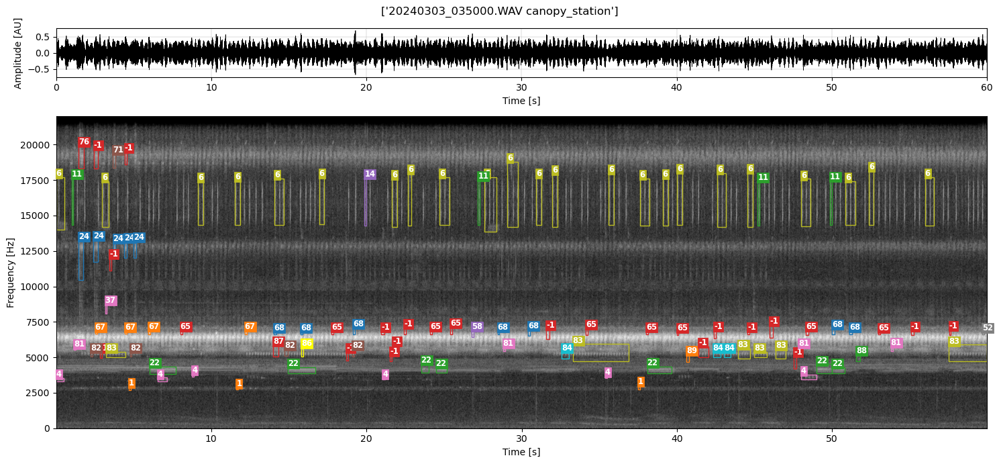

'20240303_035000.WAV'

In [17]:
# Display the ROIS
# -------------------------------

bambird.overlay_rois(
                    cluster         = df_cluster,
                    params          = params['PARAMS_EXTRACT'],
                    column_labels   = 'cluster_number', #auto_label cluster_number
                    unique_labels   = np.sort(df_cluster.cluster_number.unique()),
                    # filename        = '20240302_211000.WAV', # 20240302_131500 '20240303_023500.WAV', # S4A09128_20211011_033000 S4A09128_20211008_064500 S4A09128_20210211_043000 S4A09128_20211026_044500 S4A09128_20210603_074500 S4A09128_20210917_103000
                    random_seed     = None,
                    verbose         = True
                    )

Combine ROIs from the same cluster that very close to each other 

In [18]:
df_combined = bambird.multi_cpu_combine_rois(
                                    df_cluster,
                                    remove_noise = True,
                                    params = params['PARAMS_CLUSTER'],
                                    verbose=False)

# number of rois after combining rois compare to the number of rois before
print("The number of ROIs before combining ROIs is %d" %len(df_cluster))
print("The number of ROIs after combining ROIs is %d" %len(df_combined))
print("The number of ROIs that were combined is %d" %(len(df_cluster) - len(df_combined)))


100%|██████████| 23/23 [00:01<00:00, 15.65it/s]

The number of ROIs before combining ROIs is 3258
The number of ROIs after combining ROIs is 1410
The number of ROIs that were combined is 1848




============== OVERLAY ROIS ON THE ORIGINAL FILE ==============

Display ROIs found in the file /media/haupert/data/mes_projets_data/xprize/canopy_station/20240302_211000.WAV
labels : [9 9 9 9 9 48 48 48 48 48 48 48 48 68 40 40 40 40 40 40 40 40 64 64 62 62
 62 62 59 54 54 25 20 20 20 20 20 20 20 20 21 21 21 21 21 69 69 78 78 78 0
 0 0 0 0 0 0 0 0 0 1 1 1 1 4 4 4 4 4 4 56 56 56 47 47 47 47 47 47 47 15 83
 11 23 75 61 55 70 80]


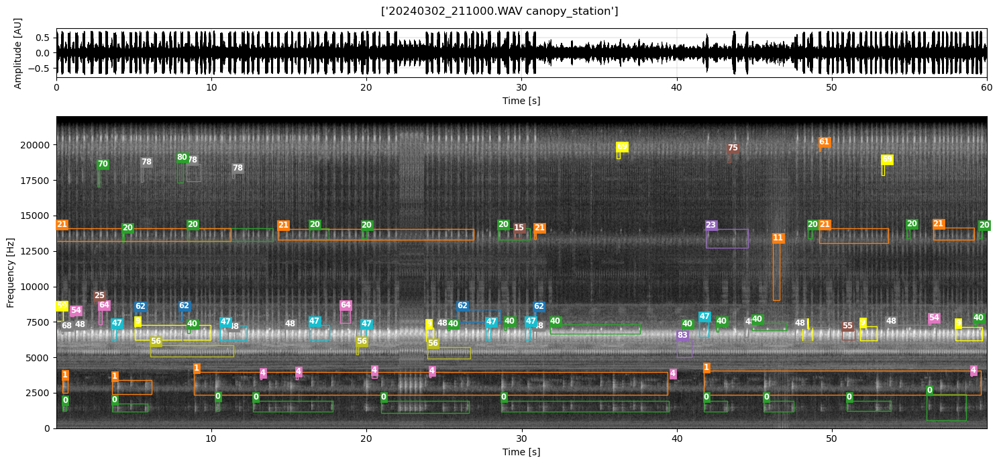

'20240302_211000.WAV'

In [19]:
# Display the ROIS
# -------------------------------

bambird.overlay_rois(
                    cluster         = df_combined,
                    params          = params['PARAMS_EXTRACT'],
                    column_labels   = 'cluster_number', #auto_label cluster_number
                    unique_labels   = np.sort(df_combined.cluster_number.unique()),
                    color_labels    = ['tab:green', 'tab:orange', 'tab:blue', 'tab:purple', 'tab:pink', 'tab:brown', 'tab:olive', 'tab:cyan', 'tab:gray', 'yellow'],
                    # filename        = None,
                    filename        = '20240302_211000.WAV', # 20240302_152500 20240303_075500 '20240303_063500.WAV', #'20240303_023500.WAV', 
                    random_seed     = None,
                    verbose         = True)

## 3.2 Clustering of the noise only

1. Select the ROIs with the cluster number = -1
2. Change/ adapt the clustering parameters to the noise. For instance, the cluster size might be smaller as most of the sounds considered as noise are rare events.
3. Do the clustering (about 10s) and change the cluster number to negative number in order to distinguish the first "big" clusters to the second "smaller" clusters coming from "noise"
4. Overlay the clusters
5. Combine ROIs that belong to the same cluster and that are very close to each other in order to form new longer ROIs. This will reduce the number of ROIs to listen to and will help the experts for the identification


In [20]:
#  Cluster ROIS
# -------------------------------
# get the samples in df_cluster that are noise (cluster_number = -1) and then
# get the samples from index in df_cluster_noise in df_features_selected that are noise (cluster_number = -1)
df_features_noise = df_features_selected.loc[df_cluster[df_cluster.cluster_number == -1].index]

params_noise = params['PARAMS_CLUSTER'].copy()
params_noise['MIN_PTS'] = np.max([int(len(df_features_noise) * 0.05/100), 5])
params_noise['MIN_CORE_PTS'] = params_noise['MIN_PTS'] -1

# find the clusters by categories
df_cluster_noise, csv_cluster_noise = bambird.find_cluster(
                dataset = df_features_noise,
                params  = params_noise,
                save_csv_filename = 'cluster_noise.csv',
                display = False,
                verbose = True
                )

df_cluster_noise = df_cluster_noise.loc[df_cluster_noise[df_cluster_noise.cluster_number != -1].index]

# add a letter n to each cluster number at the beginning to differentiate the noise clusters
# except for the cluster number -1 which is already the noise cluster
df_cluster_noise['cluster_number'] = df_cluster_noise['cluster_number'].apply(lambda x: -x)




====================== CLUSTER FEATURES ======================

HDBSCAN eps 0.17644263914565694; min_samples 5; min core samples 4; Number of soundtypes found for canopy_station : 5; 100.0% are clustered




============== OVERLAY ROIS ON THE ORIGINAL FILE ==============

Display ROIs found in the file /media/haupert/data/mes_projets_data/xprize/canopy_station/20240303_012000.WAV
labels : [-2 -2 -2 -4 -4 -2 -4 -2 -2 -2 -4 -4 -1 -1  0 -1 -1  0  0 -2 -2 -2]


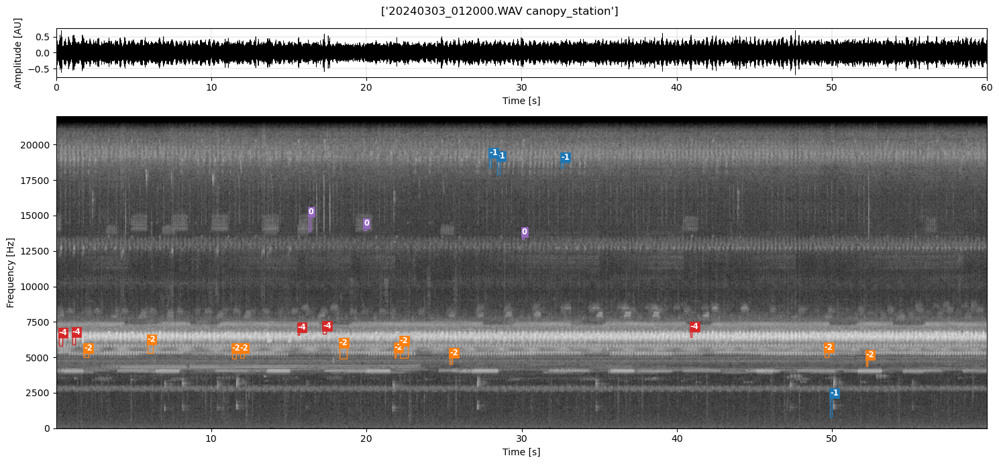

'20240303_012000.WAV'

In [21]:
# Display the ROIS
# -------------------------------
bambird.overlay_rois(
                    cluster         = df_cluster_noise,
                    params          = params['PARAMS_EXTRACT'],
                    column_labels   = 'cluster_number', #auto_label cluster_number
                    unique_labels   = np.sort(df_cluster_noise.cluster_number.unique()),
                    # filename        = '20240302_211000.WAV', # 20240303_074000.WAV 20240302_130000
                    random_seed     = None,
                    verbose         = True
                    )

In [22]:
df_combined_noise = bambird.multi_cpu_combine_rois(
                                    df_cluster_noise,
                                    remove_noise = True,
                                    params = params['PARAMS_CLUSTER'],
                                    verbose=False)

# number of rois after combining rois compare to the number of rois before
print("The number of ROIs before combining ROIs is %d" %len(df_cluster_noise))
print("The number of ROIs after combining ROIs is %d" %len(df_combined_noise))
print("The number of ROIs that were combined is %d" %(len(df_cluster_noise) - len(df_combined_noise)))


100%|██████████| 23/23 [00:00<00:00, 54.16it/s]

The number of ROIs before combining ROIs is 533
The number of ROIs after combining ROIs is 263
The number of ROIs that were combined is 270




============== OVERLAY ROIS ON THE ORIGINAL FILE ==============

Display ROIs found in the file /media/haupert/data/mes_projets_data/xprize/canopy_station/20240303_003000.WAV
labels : [-4 -4 -4 -4 -4 -4 -4 -4 -2 -2 -2 -2 -2 -2 -3 -3 -3 0 0]


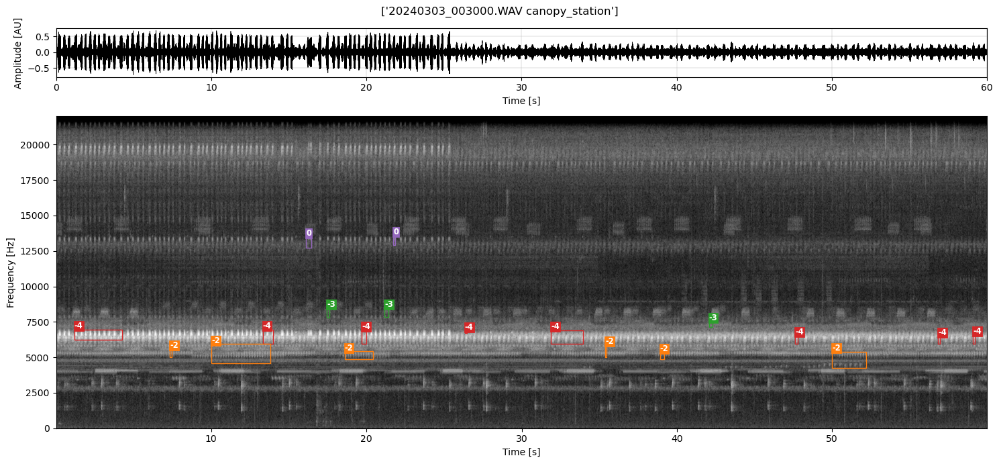

'20240303_003000.WAV'

In [23]:
# Display the ROIS
# -------------------------------

bambird.overlay_rois(
                    cluster         = df_combined_noise,
                    params          = params['PARAMS_EXTRACT'],
                    column_labels   = 'cluster_number', #auto_label cluster_number
                    unique_labels   = np.sort(df_cluster_noise.cluster_number.unique()),
                    # filename        = None,
                    # filename        = '20240302_211000.WAV', # 20240302_161000 20240303_063500 20240303_075500 '20240303_063500.WAV', #'20240303_023500.WAV', # S4A09128_20211011_033000 S4A09128_20211008_064500 S4A09128_20210211_043000 S4A09128_20211026_044500 S4A09128_20210603_074500 S4A09128_20210917_103000
                    random_seed     = None,
                    verbose         = True
                    )

## 3.3 Combine cluster and cluster with noise



============== OVERLAY ROIS ON THE ORIGINAL FILE ==============

Display ROIs found in the file /media/haupert/data/mes_projets_data/xprize/canopy_station/20240302_211000.WAV
labels : [9 9 9 9 9 48 48 48 48 48 48 48 48 68 40 40 40 40 40 40 40 40 64 64 62 62
 62 62 59 54 54 25 20 20 20 20 20 20 20 20 21 21 21 21 21 69 69 78 78 78 0
 0 0 0 0 0 0 0 0 0 1 1 1 1 4 4 4 4 4 4 56 56 56 47 47 47 47 47 47 47 15 83
 11 23 75 61 55 70 80 -4 -4 -4 -4 -4 -4 -4 -4 -3 -3 -3 -3 0 0 0 0 0 -2 -2
 -2]


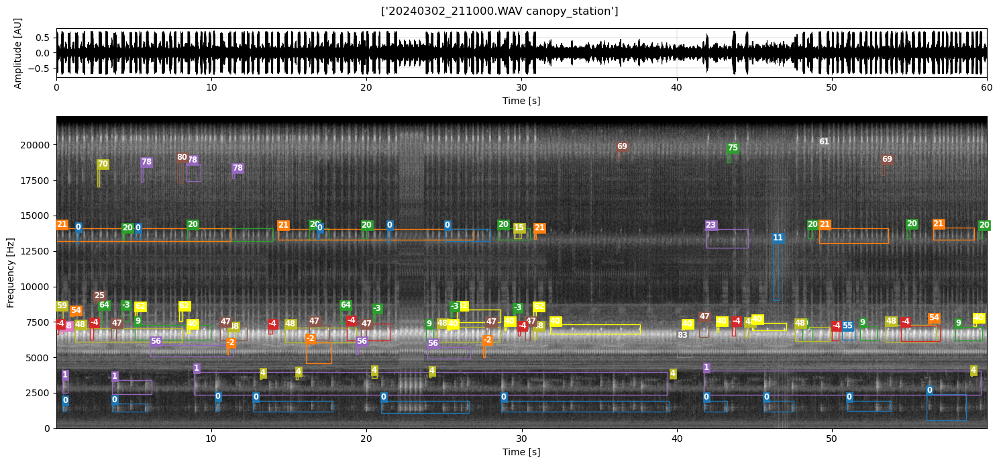

'20240302_211000.WAV'

In [25]:
# merge df_cluster and df_cluster_noise
df_combined_all = pd.concat([df_combined, df_combined_noise], ignore_index=True)

# Display the ROIS
# -------------------------------

bambird.overlay_rois(
                    cluster         = df_combined_all,
                    params          = params['PARAMS_EXTRACT'],
                    column_labels   = 'cluster_number', #auto_label cluster_number
                    unique_labels   = np.sort(df_combined_all.cluster_number.unique()),
                    # filename        = '20240303_071500.WAV', # 20240302_161000 20240303_063500 20240303_075500 '20240303_063500.WAV', #'20240303_023500.WAV', # S4A09128_20211011_033000 S4A09128_20211008_064500 S4A09128_20210211_043000 S4A09128_20211026_044500 S4A09128_20210603_074500 S4A09128_20210917_103000
                    random_seed     = None,
                    verbose         = True
                    )


In [26]:
# NN = 1
# for idx, row in df_combined[df_combined_all.cluster_number == NN].iloc[0:10].iterrows():
#     # open the audio file
#     s, fs = maad.sound.load(row['fullfilename'])
#     # trim the audio file
#     s = maad.sound.trim(s, fs, row['min_t'], row['max_t'])
#     # select the bandwidth
#     s = maad.sound.select_bandwidth(s, fs, fcut=[row['min_f'], row['max_f']], forder=3, ftype='bandpass')
#     # compute the spectrogram
#     Sxx, tn, fn, ext = maad.sound.spectrogram(s, fs, nperseg=1024, noverlap=512)
#     # display the spectrogram
#     maad.util.plot_spectrogram(Sxx, fn, db_range=60, figsize=(1.5, 2), title=os.path.basename(row['fullfilename']))

## 3.4 Prepare clusters

1. Reorder the dataframe by cluster_number starting by the biggest size
2. (optional) keep only the biggest clusters corresponding to XX percentile of the dataset.
3. Find representative samples and save dataframe
4. Keep the most representative samples, add columns and save the results in a csv

In [28]:
# Reorder the dataframe by cluster_number starting by the biggest size
# --------------------------------------------------------------------

df_cluster_combined = df_combined_all.copy()

# count the number of each cluster_number
counts = df_cluster_combined["cluster_number"].value_counts()

# sort counts value from the highest count to the lowest
counts = counts.sort_values(ascending=False)

# map the count to the cluster_number
df_cluster_combined['count'] = df_cluster_combined['cluster_number'].apply(lambda x: counts.get(x, str(-1)))

# Reorder the dataframe starting the highest number of clusters 
df_cluster_combined.sort_values(by='count', ascending=False, inplace=True)

# Get the cluster numbers in ascending order (without the noise -1)
CLUSTER_NUM_ASC_ORDER = list(df_cluster_combined.loc[~(df_cluster_combined['cluster_number']==-1),:]['cluster_number'].value_counts().index)

print("List of the cluster number from the biggest cluster to the smallest cluster : {}".format(list(CLUSTER_NUM_ASC_ORDER)))



List of the cluster number from the biggest cluster to the smallest cluster : [0, -2, 4, 1, -4, -3, 22, 6, 78, 11, 54, 40, 36, 24, 83, 81, 14, 29, 25, 75, 5, 60, 52, 48, 65, 56, 73, 82, 13, 9, 41, 79, 93, 53, 61, 15, 50, 92, 80, 17, 68, 16, 70, 64, 97, 10, 87, 72, 84, 91, 39, 69, 85, 34, 42, 76, 94, 20, 7, 62, 46, 74, 90, 32, 43, 3, 26, 88, 47, 49, 71, 30, 38, 95, 45, 31, 27, 51, 57, 21, 89, 33, 96, 77, 63, 2, 66, 18, 86, 37, 12, 28, 58, 23, 59, 55, 8, 67, 44, 35, 19]


Compute different metrics (cosine_likeness dist_likeness normdist) to estimate the likeness or the distance to the "centroid" of a cluster (= features of all ROIs that belongs to a cluster are averaged)

In [29]:
NUM_SAMPLES_BY_CLUSTER = 50
METRIC = 'dist' # normdist cosine dist (cosine_likeness dist_likenes : be carefull in this case the highest the better)

# find representative samples and save dataframe
#------------------------------------------------
df_cluster_repsamples = find_representative_samples(df_cluster_combined)

# select the top 50 samples per cluster
#----------------------------------------
# Group the dataframe by category and get the top 20 rows per category based on lowest normdist. Remove noise cluster (-1)
cols = ['cluster_number', 'count', 'filename_ts',  'fullfilename_ts', 'fullfilename','filename', 'min_t', 'max_t', 'min_f', 'max_f', METRIC, 'model', 'date','label']
df_cluster_selected = df_cluster_repsamples[cols].groupby('cluster_number').apply(lambda x: x.nsmallest(NUM_SAMPLES_BY_CLUSTER, METRIC) if len(x) >= NUM_SAMPLES_BY_CLUSTER else x)
# reset the index
df_cluster_selected.reset_index(drop=True, inplace=True)
# remove the noise cluster
df_cluster_selected = df_cluster_selected.loc[~ (df_cluster_selected.cluster_number==-1),:]
# cast the column date to datetime
df_cluster_selected['date'] = pd.to_datetime(df_cluster_selected['date'])
# add a column period with night (from 19h to 6h) dawn (from 6h to 9h) day (from 9h to 16h) and dusk (from 16h to 19h)
df_cluster_selected['period'] = df_cluster_selected['date'].apply(lambda x: '1. night' if x.hour >= 19 or x.hour < 6 else '2. dawn' if x.hour >= 6 and x.hour < 9 else '3. day' if x.hour >= 9 and x.hour < 16 else '4. dusk')
# rename the column label into suggested label
df_cluster_selected.rename(columns={'label':'suggested_label'}, inplace=True)
# add columns for the group (insect, bird, bat, frog, noise, unknown), scientific_name, english_name, portugese_name
df_cluster_selected['group (insect, bird, bat, frog, noise, unknown)'] = ''
df_cluster_selected['scientific_name'] = ''
df_cluster_selected['english_name'] = ''
df_cluster_selected['portugese_name'] = ''
# reorder the columns
cols = ['cluster_number', 'filename_ts', 'period', 'suggested_label', 'group (insect, bird, bat, frog, noise, unknown)', 'scientific_name', 'english_name', 'portugese_name', 'count',  'model', 'date', 'fullfilename_ts', 'fullfilename','filename', 'min_t', 'max_t', 'min_f', 'max_f', METRIC, ]    
df_cluster_selected = df_cluster_selected[cols]
# reorder the dataframe by cluster_number and by period 
df_cluster_selected.sort_values(by=['cluster_number', 'period'], inplace=True)

# save the dataframe
#--------------------
filename = str(DATASET_NAME) + '_CLUSTERS_COMBINED.csv'
# test if the directory exists
if not os.path.exists(SAVE_PATH):
    os.makedirs(SAVE_PATH)
df_cluster_selected.to_csv(SAVE_PATH / filename, index=False)

In [30]:
# test the function extract_roi on a row of df_cluster_selected
incr = 0
for idx, row in df_cluster_selected.iterrows():
    # extrac the filename without the extension
    filename_ts = row['filename'].split('.')[0] + '_' + str(incr) + '.WAV'
    df_cluster_selected.loc[idx, 'filename_ts'] = filename_ts
    # create the fullfilename_ts path
    fullfilename_ts = str(SAVE_PATH / Path(str(DATASET_NAME) +  ('_CLUSTERS_COMBINED'))  / str(row['cluster_number']) / str(row['period']) / filename_ts)
    df_cluster_selected.loc[idx, 'fullfilename_ts'] = fullfilename_ts
    roi = extract_roi(
                row['fullfilename'], 
                row['min_t'], row['max_t'], row['min_f'], row['max_f'], 
                margins = [0.5, 500],
                normalize = True,
                save_path=fullfilename_ts)
    incr += 1

# save
filename = str(DATASET_NAME) + '_CLUSTERS_COMBINED.csv'
# test if the directory exists
if not os.path.exists(SAVE_PATH):
    os.makedirs(SAVE_PATH)
df_cluster_selected.to_csv(SAVE_PATH / filename, index=False)


In [ ]:
# # Save the most representative ROIS of each cluster in folders
# for index, row in df_cluster_selected.iterrows():
#     # get the cluster number
#     cluster_number = row.cluster_number
#     # create the path
#     folder = Path(str(DATASET_NAME) +  ('_CLUSTERS_COMBINED')) 
#     # create the folders and subfolders
#     try:
#         os.makedirs(SAVE_PATH / folder / str(cluster_number))
#     except FileExistsError:
#         # directory already exists
#         print("directory {} already exists".format(SAVE_PATH / folder / str(cluster_number)))
#         pass
#     # copy paste the file in the right directory 
#     try : 
#         src = DATA_PATH / ROIS_NAME / Path(row.fullfilename).parts[-2] /row.filename_ts
#         dst = SAVE_PATH / folder / str(cluster_number) / row.filename_ts
#         shutil.copy2(src,dst)
#     except  :
#         # directory already exists
#         print("file {} does not exist".format(DATA_PATH / ROIS))
#         df_cluster_selected.drop(index=index, inplace=True)
#         pass

Select the metric and then display the most representative ROI of the cluster and then the random ROIs that are below or upper of a threshold

100%|██████████| 101/101 [01:17<00:00,  1.30it/s]


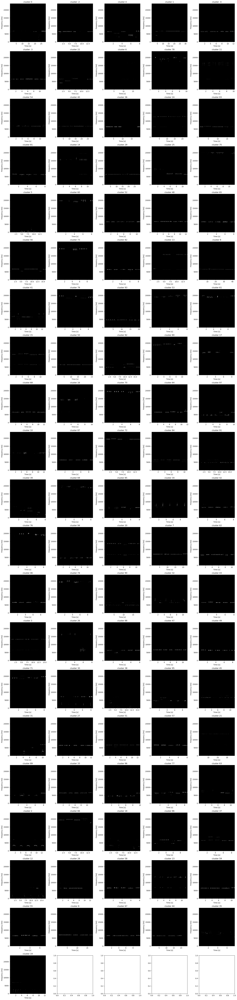

In [31]:
import matplotlib.pyplot as plt
from math import ceil
from scipy import signal
from tqdm import tqdm

# Create vignettes with the most representative ROIs for each cluster
#----------------------------------------------------------------------

# get the cluster number list from the biggest cluster to the smallest
cluster_number_list = CLUSTER_NUM_ASC_ORDER

# prepare the grid
columns = 5
rows = ceil(len(cluster_number_list) / columns)
fig, axes = plt.subplots(rows, columns, figsize = (20,20/columns*rows))

# Max number of samples by cluster
NUM_SAMPLES = 5

# initialize the counter
ii = 0

# 1. zero padding
#-----------------------------------------------------------------------
# get the fs
_, fs = maad.sound.load(df_cluster_selected.fullfilename_ts.values[0])

# create the vector of zero padding
duration = 0.5 # in seconds
sig0 = [0] * int(fs*duration)

# 2. load 5 audio for each cluster and concatenate them into a single audio
#-----------------------------------------------------------------------

for num in tqdm(cluster_number_list):

    sub_df = df_cluster_selected[df_cluster_selected['cluster_number'] == num]

    # Sort the dataframe by the value of the metric
    sub_df = sub_df.sort_values(by=METRIC)

    # Sample the rows. Get a maximum of NUM_SAMPLES rows. 
    # Could be less if the dataframe as less rows
    try :
        sub_df = sub_df.iloc[0:NUM_SAMPLES]
    except:
        print("less samples than the number required N={}".format(NUM_SAMPLES))

    # initialize an empty list
    sig = []

    for _ , row in sub_df.iterrows() :

        # load the audio
        sig1, fs = maad.sound.load(row.fullfilename_ts)
        # trim the audio
        # sig1 = maad.sound.trim(sig1, fs, min_t=0, max_t=(len(sig1)/fs)-CNN_MARGINS_T)
        # create a tukey window to avoid discontinuities
        window = signal.windows.tukey(len(sig1), alpha=0.05)
        # apply the window
        sig1 = (sig1 * window).tolist()

        # merge all sig with zero padding in between
        sig  += sig0 + sig1
    
    # list to array
    sig = np.asarray(sig)
    
    # Compute the spectrogram of the concatenate audio
    Sxx, tn, fn, ext = maad.sound.spectrogram(sig, fs, nperseg=1024)

    # Convert into dB from 0dB to 96dB maximum
    Sxx_dB = maad.util.power2dB(Sxx, db_range=96) + 96

    # Plot the spectrogram in the right subplot
    rr = ii // columns
    cc = ii - rr * columns
    maad.util.plot_spectrogram(Sxx_dB, extent=ext, 
                                # db_range=30, 
                                # gain=20, 
                                log_scale = False,
                                now = False,
                                title = 'cluster ' + str(num),
                                colorbar=False, ax=axes[rr, cc],
                                vmin=np.percentile(Sxx_dB,99), vmax=np.percentile(Sxx_dB,99.99))

    ii = ii +1

# 3. Save figure
#-----------------------------------------------------------------------
filename = str(DATASET_NAME) + '.pdf'
plt.savefig(SAVE_PATH /filename)
filename = str(DATASET_NAME) + '.png'
plt.savefig(SAVE_PATH /filename)

# Display
plt.show()